<a href="https://colab.research.google.com/github/Neo-glitch/computer-vision-masterclass/blob/main/Face_And_Eye_Detection_using_OpenCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# mount gDrive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import cv2
# alt to cv2.imshow in google colab
from google.colab.patches import cv2_imshow

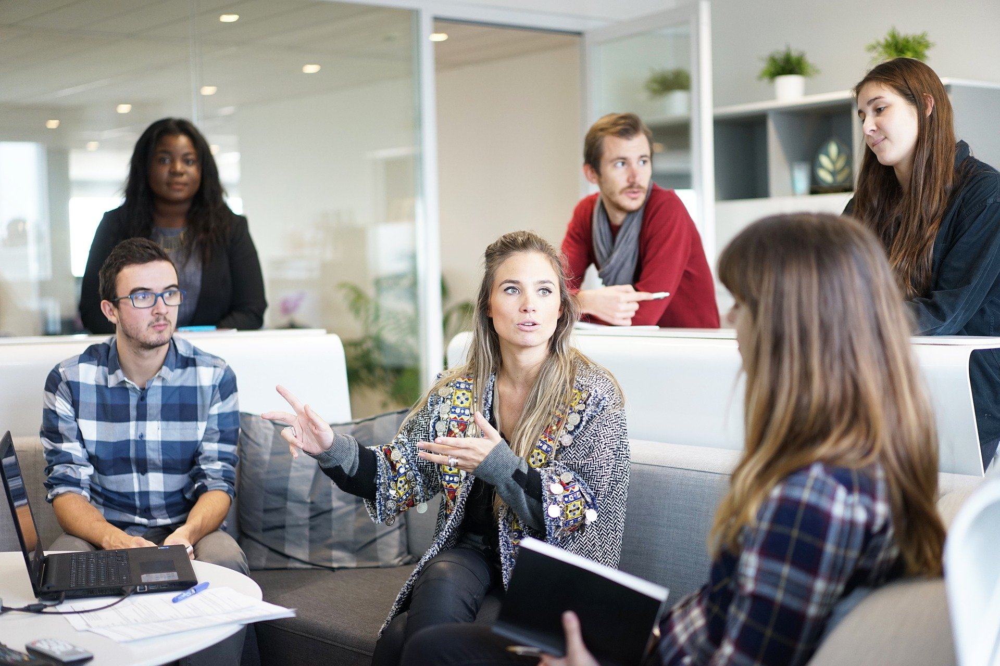

In [ ]:
image_path = "/content/drive/MyDrive/Computer Vision Masterclass Files/Images/people1.jpg"
image = cv2.imread(image_path)  

image.shape
cv2_imshow(image)

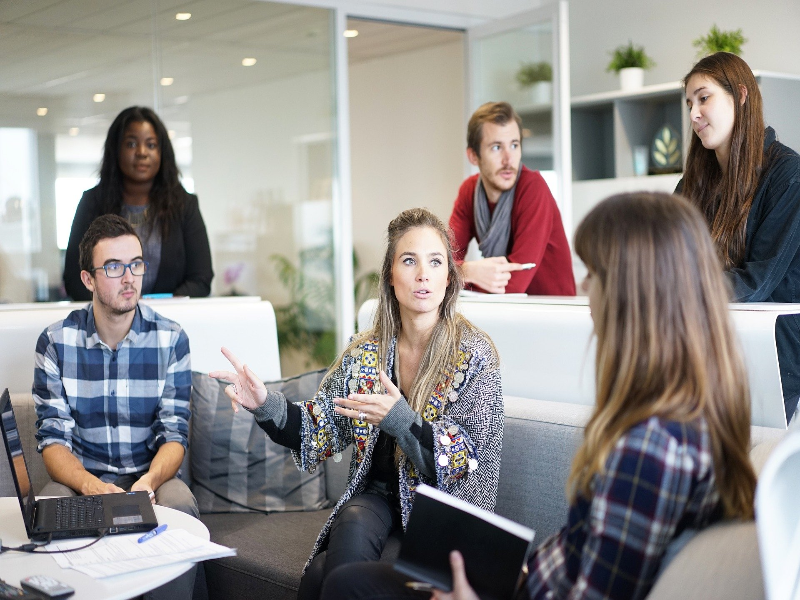

In [ ]:
image = cv2.resize(image, (800, 600))

cv2_imshow(image)

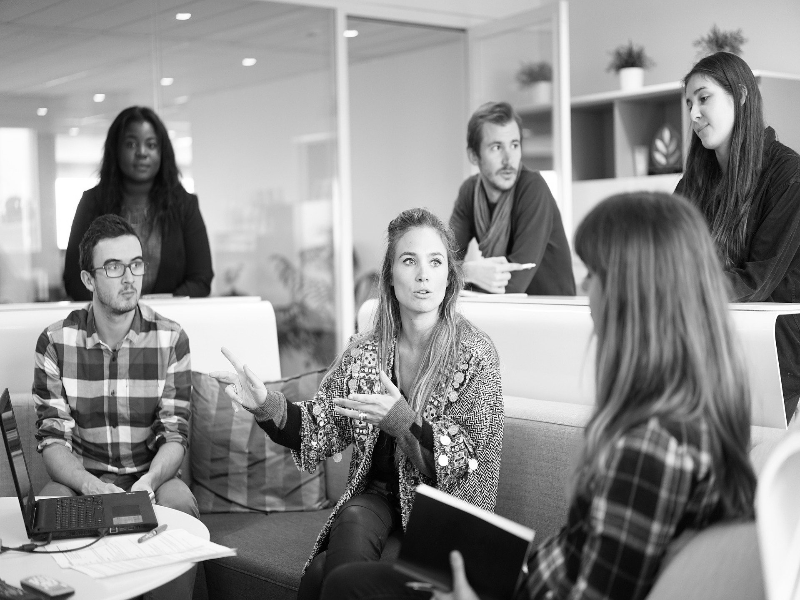

In [ ]:
# to grayscale for faster operation
# N.B: normally image channel in RGB but in openCV it's BGR color space
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

cv2_imshow(image_gray)

In [ ]:
image_gray.shape, image.shape

((600, 800), (600, 800, 3))

##### Detecting Faces using precomputed cascade clf

In [ ]:
face_detectors = cv2.CascadeClassifier("/content/drive/MyDrive/Computer Vision Masterclass Files/Cascades/haarcascade_frontalface_default.xml")

In [ ]:
detections = face_detectors.detectMultiScale(image_gray)

# each row is a detected face
# first two value of row is x, y location of face(x counts from left to right and y from top to down)
# and last two is the size(width, height) of face detected
detections

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

In [ ]:
print(f"num of faces detected: {len(detections)}")

num of faces detected: 6


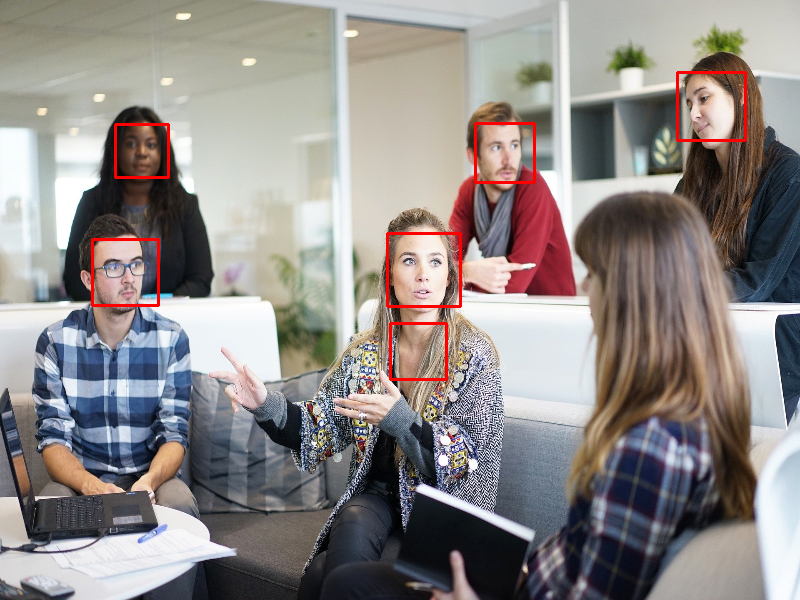

In [ ]:
for(x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), 2)

cv2_imshow(image)

number of faces detected are: 5


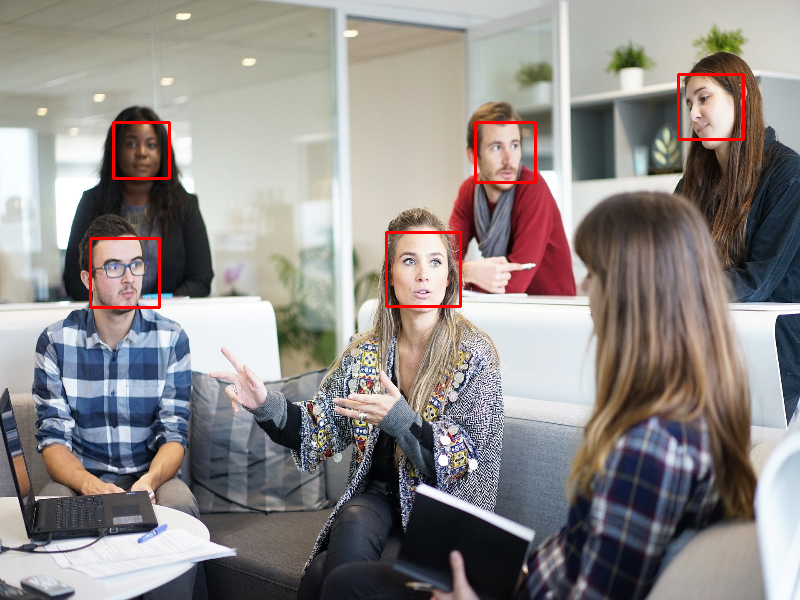

In [ ]:
# improve haarcascade detection to get better result
image = cv2.imread(image_path)  
image = cv2.resize(image, (800, 600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# scale factor det how much to upsample or downsample image size when creating img pyramid for detection
# must be greater than 1, also helps in detecting smaller faces
# n.b: The larger the obj to be detected(faces) the more the scale value, smaller scale helps to detect more images
#  and sometimes FP
detections = face_detectors.detectMultiScale(image_gray, scaleFactor = 1.09)
print(f"number of faces detected are: {len(detections)}")


for(x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), 2)

cv2_imshow(image)

number of faces detected are: 11


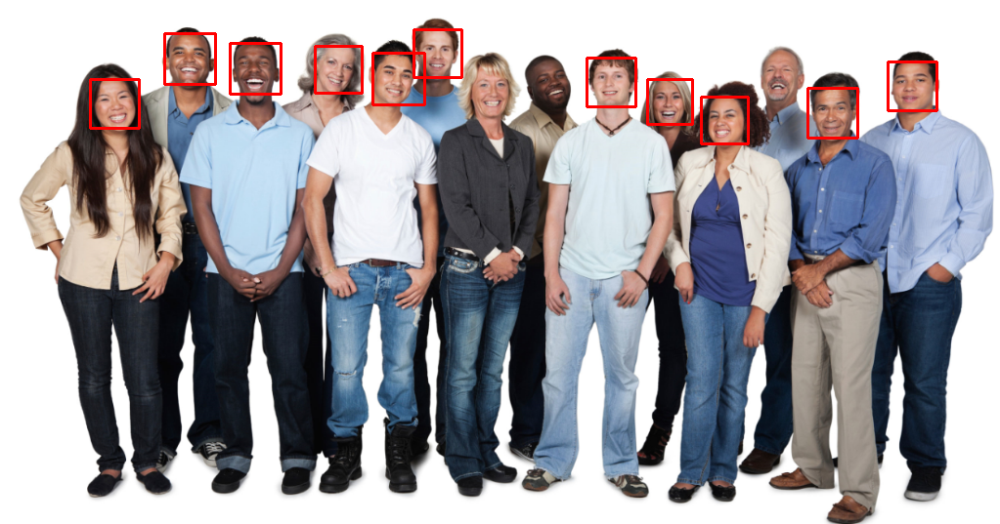

In [ ]:

image = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass Files/Images/people2.jpg")  
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


# minNeighbors det num of candidate rec needed for a face to be selected
# low values give low quality detection
detections = face_detectors.detectMultiScale(image_gray, scaleFactor = 1.3, minNeighbors = 5,
                                             minSize= (10, 10)  # min size of face to be detected
                                             )
print(f"number of faces detected are: {len(detections)}")


for(x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), 2)

cv2_imshow(image)

### Eye Detection

number of faces detected are: 5
number of eyes detected are: 9


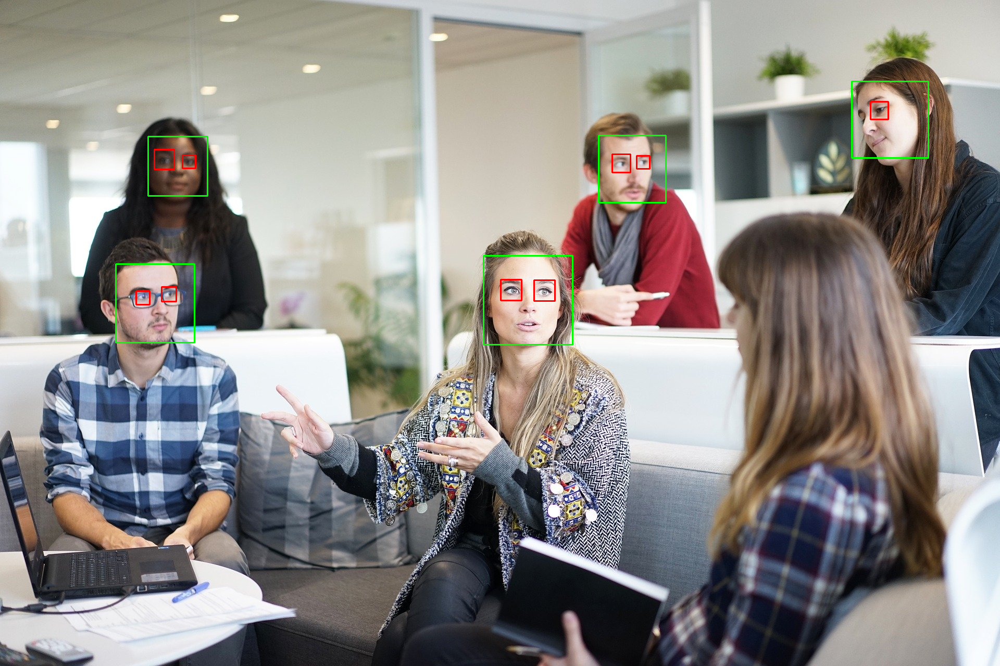

In [ ]:

image = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass Files/Images/people1.jpg")  
# image = cv2.resize(image, (800, 600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
eye_detector = cv2.CascadeClassifier("/content/drive/MyDrive/Computer Vision Masterclass Files/Cascades/haarcascade_eye.xml")

face_detections = face_detectors.detectMultiScale(image_gray, scaleFactor = 1.3, minNeighbors = 4, minSize = (30, 30) )
eye_detections = eye_detector.detectMultiScale(image_gray, scaleFactor = 1.2, minNeighbors = 7, maxSize = (50,50))

print(f"number of faces detected are: {len(face_detections)}")
print(f"number of eyes detected are: {len(eye_detections)}")

for (x, y, w, h) in face_detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)  # for faces

for (x, y, w, h) in eye_detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), 2)  # for eyes

cv2_imshow(image)

### HomeWork

In [ ]:
car_detectors = cv2.CascadeClassifier("/content/drive/MyDrive/Computer Vision Masterclass Files/Cascades/cars.xml")
clock_detectors = cv2.CascadeClassifier("/content/drive/MyDrive/Computer Vision Masterclass Files/Cascades/clocks.xml")
fullbody_detectors = cv2.CascadeClassifier("/content/drive/MyDrive/Computer Vision Masterclass Files/Cascades/fullbody.xml")


car_image_path = "/content/drive/MyDrive/Computer Vision Masterclass Files/Images/car.jpg"
clock_image_path = "/content/drive/MyDrive/Computer Vision Masterclass Files/Images/clock.jpg"
people_image_path = "/content/drive/MyDrive/Computer Vision Masterclass Files/Images/people3.jpg"

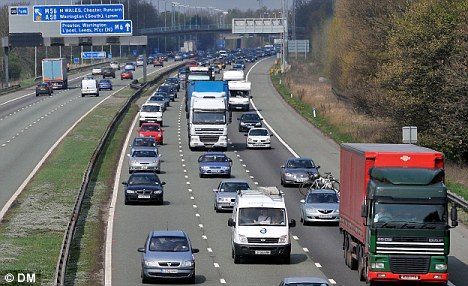

(286, 468, 3)

In [ ]:
car_image = cv2.imread(car_image_path)

cv2_imshow(car_image)
car_image.shape

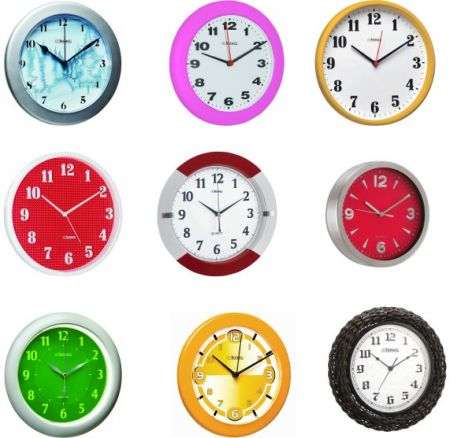

(438, 450, 3)

In [ ]:
clock_image = cv2.imread(clock_image_path)


cv2_imshow(clock_image)
clock_image.shape

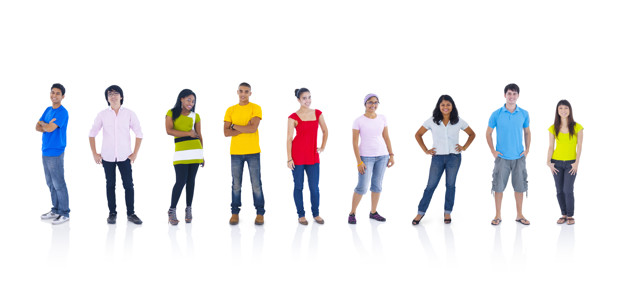

(294, 626, 3)

In [ ]:
people_image = cv2.imread(people_image_path)


cv2_imshow(people_image)
people_image.shape


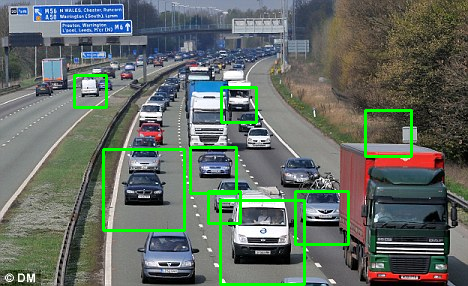

In [ ]:
# detecting cars

car_image = cv2.imread(car_image_path)
car_image_gray = cv2.cvtColor(car_image, cv2.COLOR_BGR2GRAY)

car_detections = car_detectors.detectMultiScale(car_image_gray, scaleFactor = 1.03, minNeighbors = 5)

for (x, y, w, h) in car_detections:
  cv2.rectangle(car_image, (x, y), (x + w, y+h), (0, 255, 0), 2)

cv2_imshow(car_image)

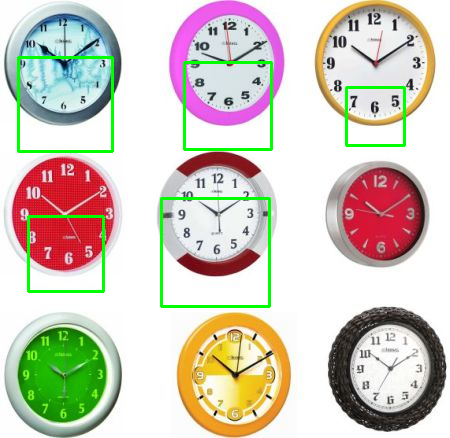

In [ ]:
# detecting clocks

clock_image = cv2.imread(clock_image_path)
clock_image_gray = cv2.cvtColor(clock_image, cv2.COLOR_BGR2GRAY)

clock_detections = car_detectors.detectMultiScale(clock_image_gray, scaleFactor = 1.03, minNeighbors = 1, minSize = (40, 40))

for (x, y, w, h) in clock_detections:
  cv2.rectangle(clock_image, (x, y), (x + w, y+h), (0, 255, 0), 2)

cv2_imshow(clock_image)

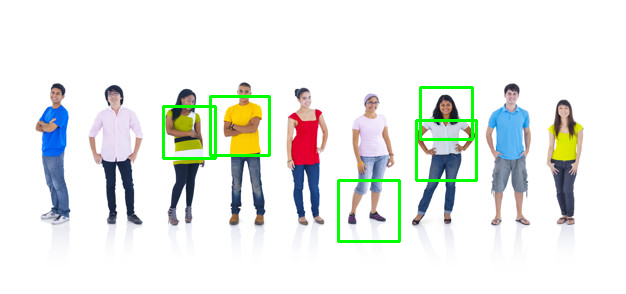

In [ ]:
# detecting body

body_image = cv2.imread(people_image_path)
body_image_gray = cv2.cvtColor(body_image, cv2.COLOR_BGR2GRAY)

body_detections = car_detectors.detectMultiScale(body_image_gray, scaleFactor = 1.0005, minNeighbors = 6, minSize = (40, 40))

for (x, y, w, h) in body_detections:
  cv2.rectangle(body_image, (x, y), (x + w, y+h), (0, 255, 0), 2)

cv2_imshow(body_image)

### Face Detection Using Dlib( Improvement of HAAR Cascades using HOG)

* Uses Histogram of gradient to det match and hence make predictions

In [ ]:
import dlib

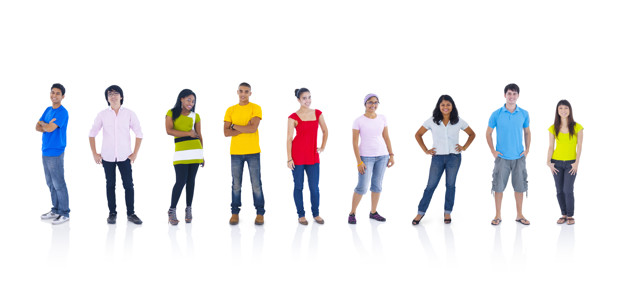

In [ ]:
image = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass Files/Images/people3.jpg")

cv2_imshow(image)

In [ ]:
face_detector_hog = dlib.get_frontal_face_detector()  # face detector using hog

In [ ]:
# works with colored image for better results
# the higher the scale value the smaller the bounding boxes(useful for smaller images or smaller objects to detect)
detections = face_detector_hog(image, 4)

detections  # bounding box to draw rectangle

print(f"\nnumber of faces detected are: {len(detections)}")


number of faces detected are: 5


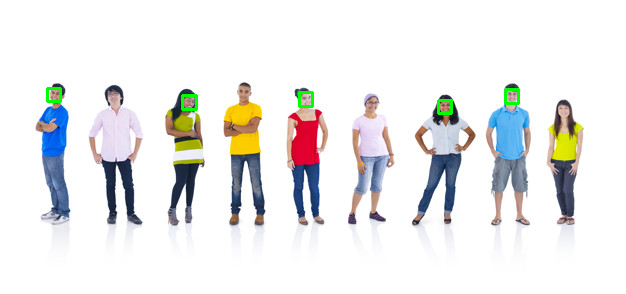

In [ ]:
for face in detections:
  cv2.rectangle(image , (face.left(), face.bottom()), (face.right(), face.top()), (0, 255, 0), 2)

cv2_imshow(image)

### Detecting Face using CNN(Generally Better than HOG except on some occassions)

In [ ]:
image = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass Files/Images/people3.jpg")

# ensure runtime is with GPU to avoid errors
cnn_detector = dlib.cnn_face_detection_model_v1("/content/drive/MyDrive/Computer Vision Masterclass Files/Weights/mmod_human_face_detector.dat")

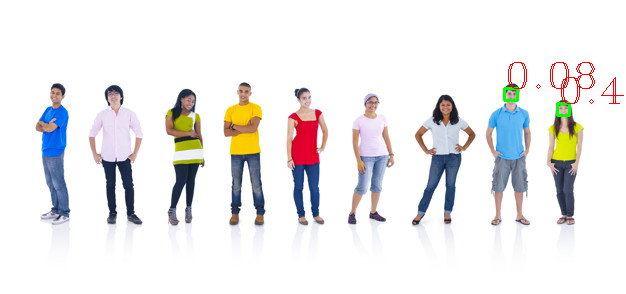

In [ ]:
# has also param for scale
detections = cnn_detector(image, 4)


for face in detections:
  left, top, right, bottom, confidence = face.rect.left(), face.rect.top(), face.rect.right(), \
    face.rect.bottom(), face.confidence
  
  cv2.rectangle(image, (left,bottom), (right, top), (0, 255,0), 2)
  cv2.putText(image, "{0:.2f}".format(confidence), (left, top), cv2.FONT_HERSHEY_PLAIN, 1, (0, 0, 255), 1)

cv2_imshow(image)

#### N.b: When developing face detection solution using openCV best to check all especially HOG against CNN to know which performs better